In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import math
import numpy as np
import xlsxwriter
from openpyxl import load_workbook

from ipynb.fs.full.UtilFunctions import spearman_rank_corr, format_season, merge_standings
from ipynb.fs.full.UtilCollections import SEASONS, PARAMS, CURRENT_TEAMS, PLAYER_STATS, BENCH_STATS

In [2]:
pylab.rcParams.update(PARAMS)

In [3]:
def calculate_rank_corr_by_team_stat(df, eastern_standings, western_standings, stat):
    
    corr_df = df.sort_values(by=[stat, 'Team'], ascending=[False, True])
    
    teams = list(corr_df.index)
    rank = range(1, 31)
    zip_iterator = zip(teams, rank)

    teams_ordered_by_stat = dict(zip_iterator)
    
    standings = merge_standings(eastern_standings, western_standings)
        
    rank1 = []
    rank2 = []
    for team in CURRENT_TEAMS:
        if team in standings:
            rank1.append(teams_ordered_by_stat[team])
            rank2.append(standings[team])

    return spearman_rank_corr(rank1, rank2)

In [4]:
def rank_team_corrs_to_excel(dfs, eastern_standings_dfs, western_standings_dfs, stat):
    corrs = [stat]
    
    n = len(dfs)
    
    for i in range(n):
        corrs.append(calculate_rank_corr_by_team_stat(dfs[i], eastern_standings_dfs[i], western_standings_dfs[i], stat))
        
    wb = load_workbook("DataCollection/Correlation/Rank_Correlation_bench_Players_Stats.xlsx")
    ws = wb.worksheets[0]
    
    ws.append(corrs)
    wb.save("DataCollection/Correlation/Rank_Correlation_bench_Players_Stats.xlsx")

In [5]:
def get_csvs_by_season(season):
    first_year, second_year = format_season(season)
    
    player_df = pd.read_csv("DataCollection/Player_Stats/player_stats_{0}-{1}.csv".format(first_year, second_year))
    team_df = pd.read_csv("DataCollection/Team_Stats/team_stats_{0}-{1}.csv".format(first_year, second_year))
    adv_team_df = pd.read_csv("DataCollection/Advanced_Team_Stats/adv_team_stats_{0}-{1}.csv".format(first_year, second_year))
    opponent_df = pd.read_csv("DataCollection/Opponent_Stats/opponent_stats_{0}-{1}.csv".format(first_year, second_year))
    eastern_standings_df = pd.read_csv("DataCollection/Standings/standings_eastern_conference_{0}-{1}.csv".format(first_year, second_year))
    western_standings_df = pd.read_csv("DataCollection/Standings/standings_western_conference_{0}-{1}.csv".format(first_year, second_year))
    
    return player_df, team_df, adv_team_df, opponent_df, eastern_standings_df, western_standings_df

In [6]:
def get_playoff_csvs_by_season(season):
    first_year, second_year = format_season(season)
    
    player_df = pd.read_csv("DataCollection/Player_Stats_Playoffs/player_stats_playoffs_{0}-{1}.csv".format(first_year, second_year))    
#     standings_df = pd.read_csv("DataCollection/Standings_Playoffs/playoff_standings_{0}-{1}.csv".format(first_year, second_year))
    
    return player_df#, standings_df

In [7]:
player_dfs, team_dfs, adv_team_dfs, opponent_dfs, eastern_standings_dfs, western_standings_dfs = [], [], [], [], [], []

for season in SEASONS:
    player_df, team_df, adv_team_df, opponent_df, eastern_standings_df, western_standings_df = get_csvs_by_season(season)
    player_dfs.append(player_df)
    team_dfs.append(team_df)
    adv_team_dfs.append(adv_team_df)
    opponent_dfs.append(opponent_df)
    eastern_standings_dfs.append(eastern_standings_df)
    western_standings_dfs.append(western_standings_df)

### Get averages for bench players plus the average if bench players that play in over half their team's games

In [8]:
bench_per_season = []

for i in range(len(SEASONS)):    
    games_in_season = team_dfs[i]["G"][0]
    df = player_dfs[i].sort_values(by=['Tm', 'GS'], ascending=[True, False])
    df.insert(len(df.columns), "Count", 0)    
    bench = pd.DataFrame(columns = df.columns)
    for team in CURRENT_TEAMS:
        bench_players = pd.DataFrame(df[df["Tm"] == team][5:])
        bench_players = bench_players[bench_players["G"] > games_in_season/2]
        number_of_qualifying_reserves = bench_players.shape[0]
        bench_players = bench_players.mean()
        bench_players["Count"] = number_of_qualifying_reserves
        bench.loc[team] = bench_players

    bench.drop(["Player", "Pos", "Tm"], axis=1, inplace=True)
    bench.index.names = ["Team"]
    bench_per_season.append(bench)

In [9]:
stats = ['Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P',
       '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PER', 'TS%', '3PAr', 'FTr', 'ORB%',
       'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'USG%', 'OWS', 'DWS',
       'WS', 'WS/48', 'OBPM', 'DBPM', 'BPM', 'VORP', 'Salary', 'Count']

bench_avg_per_season = {}


for stat in stats:
    bench_avg_per_season[stat] = []
    for df in bench_per_season:
        bench_avg_per_season[stat].append(df[stat].mean())

In [10]:
bench_corr = pd.read_excel("DataCollection/Correlation/Rank_Correlation_bench_Players_Stats.xlsx")
bench_corr.set_index("Stat", inplace=True)

In [11]:
starters_corr = pd.read_excel("DataCollection/Correlation/Rank_Correlation_Starters_Stats.xlsx")
starters_corr.set_index("Stat", inplace=True)

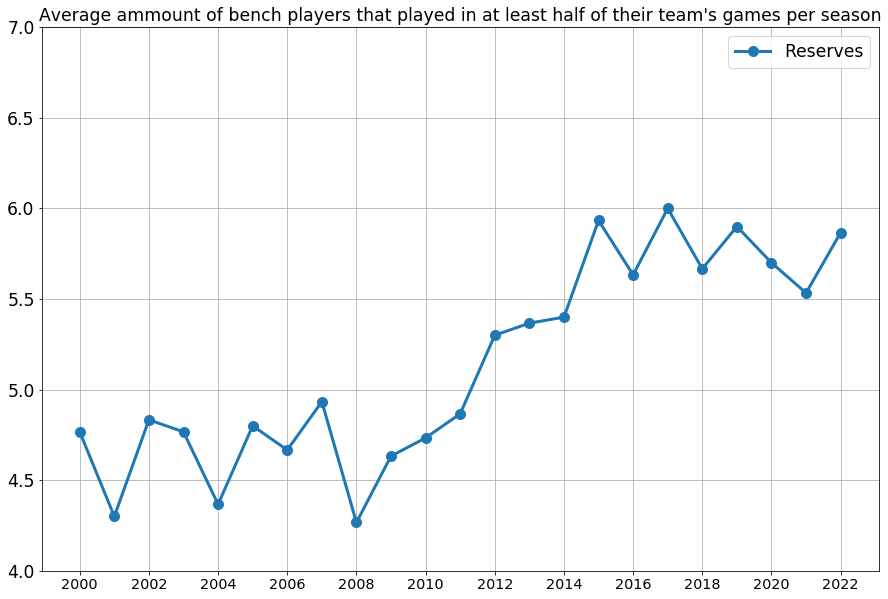

In [12]:
plt.figure(figsize=(15,10))
plt.grid()
plt.plot(SEASONS, bench_avg_per_season["Count"], label="Reserves", lw=3, marker='o', ms=10)
plt.xticks(SEASONS[::2])
plt.yticks(np.arange(4,7.5,0.5))
plt.title(f"Average ammount of bench players that played in at least half of their team's games per season")
plt.legend()
plt.show()

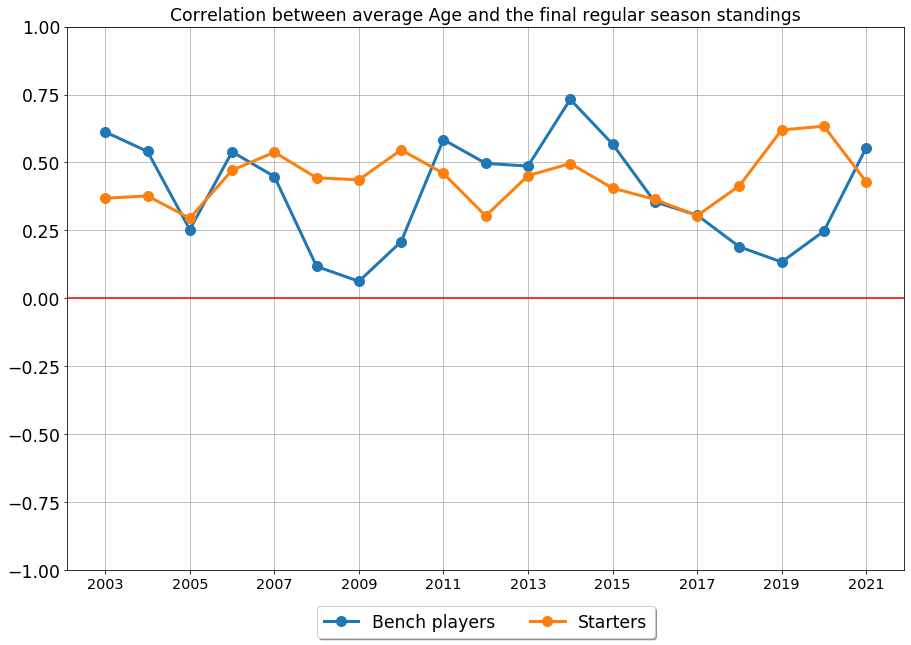

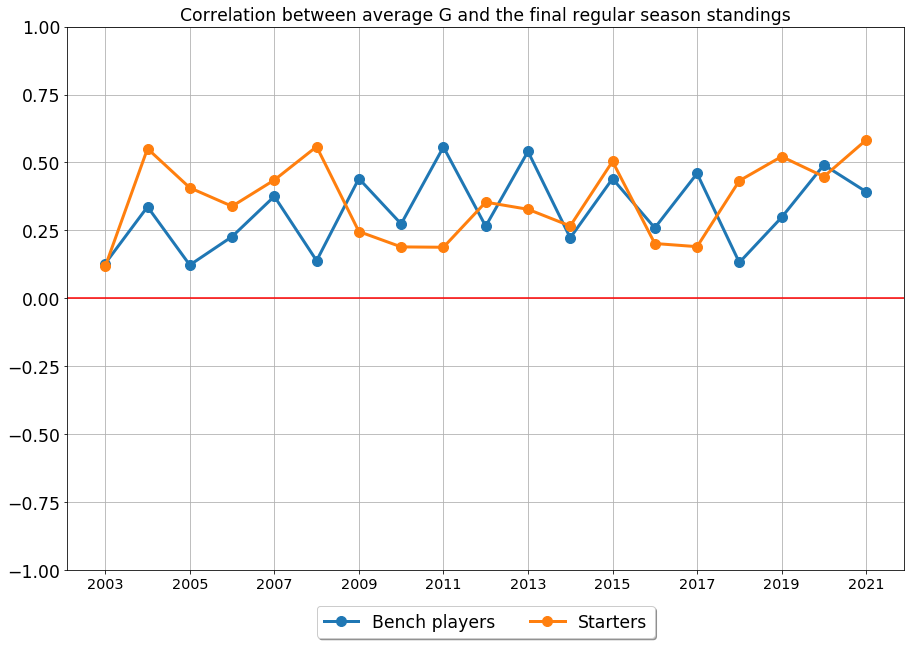

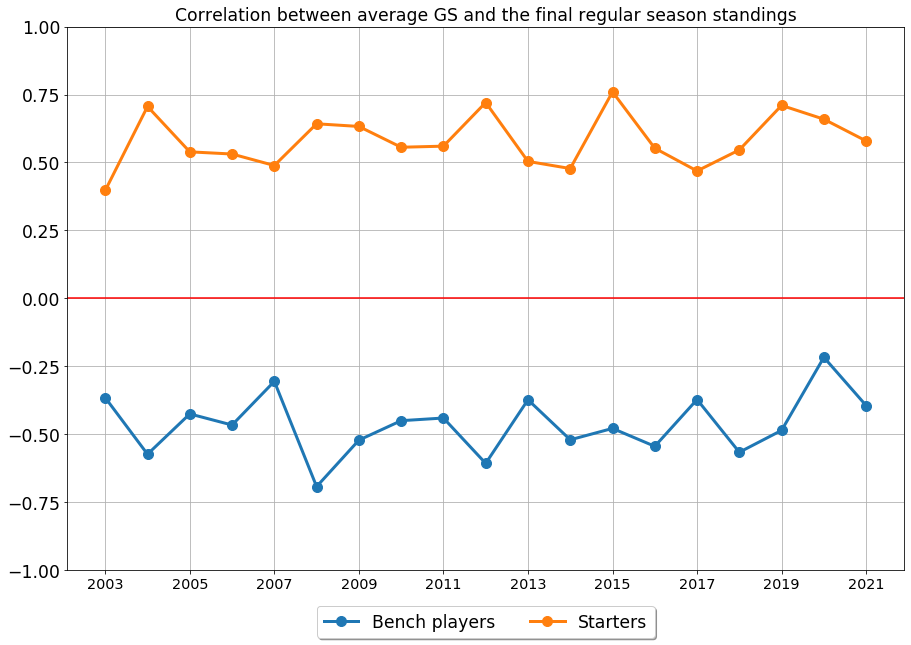

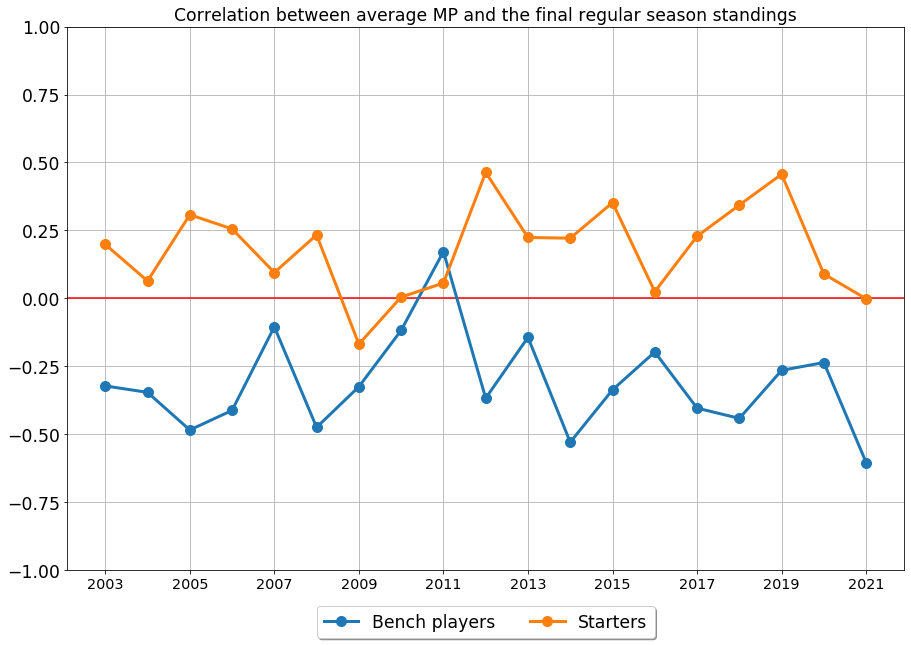

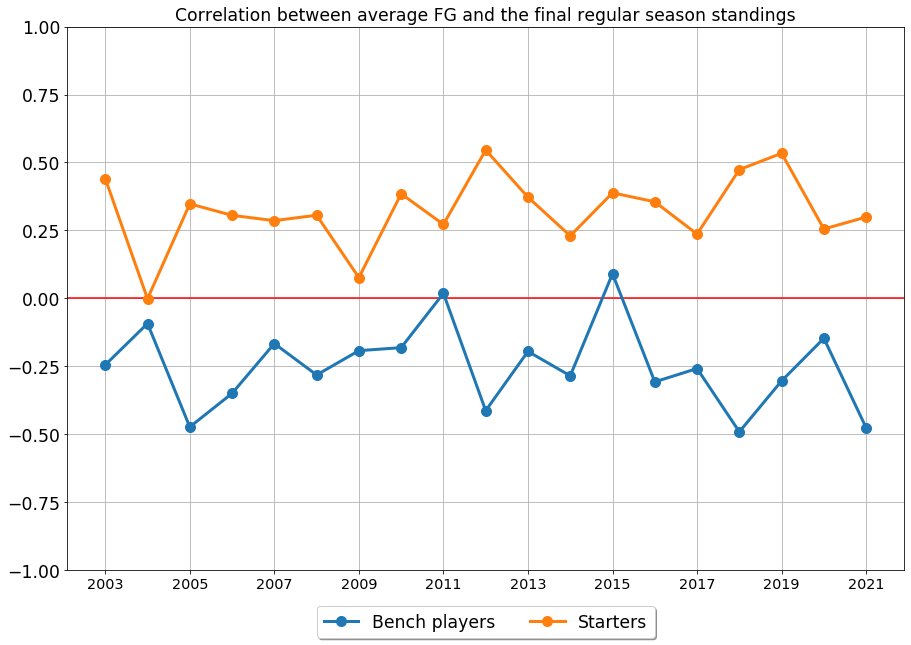

...

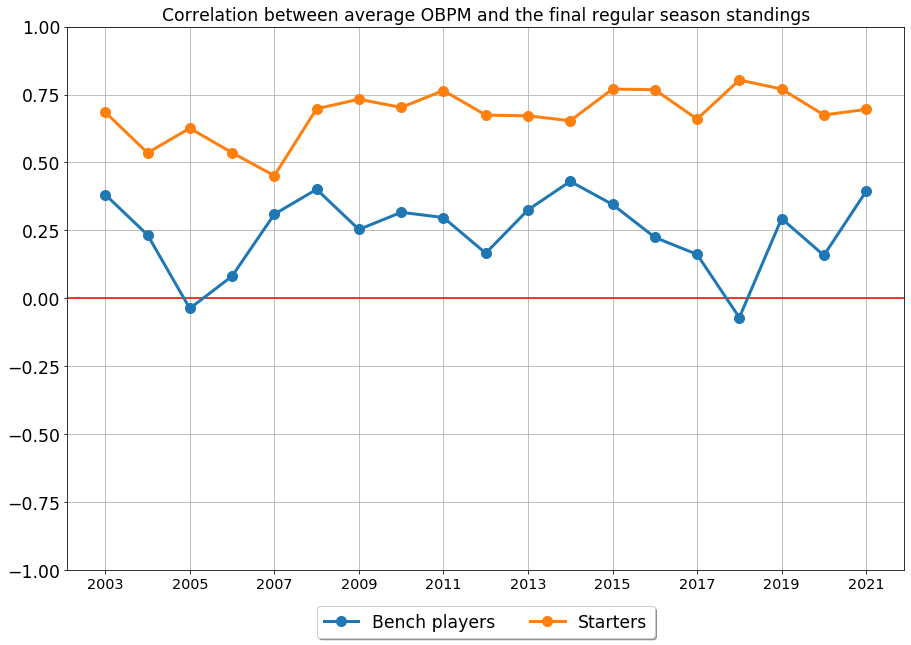

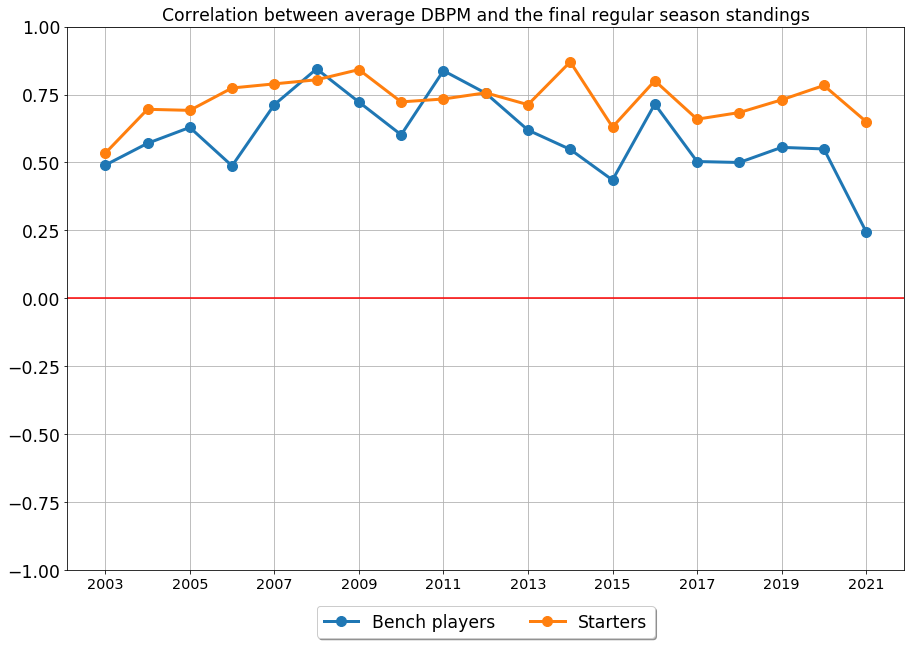

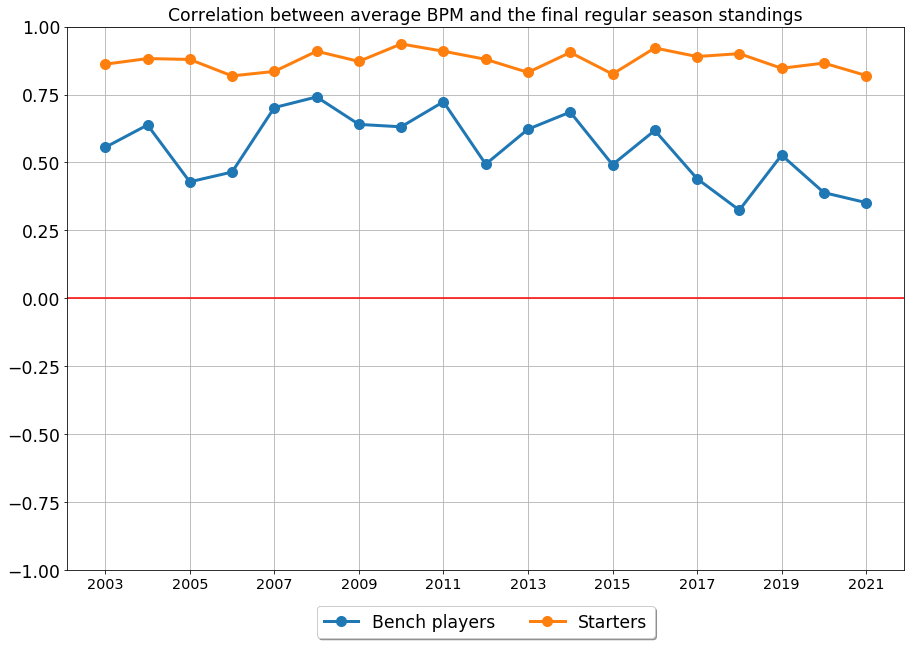

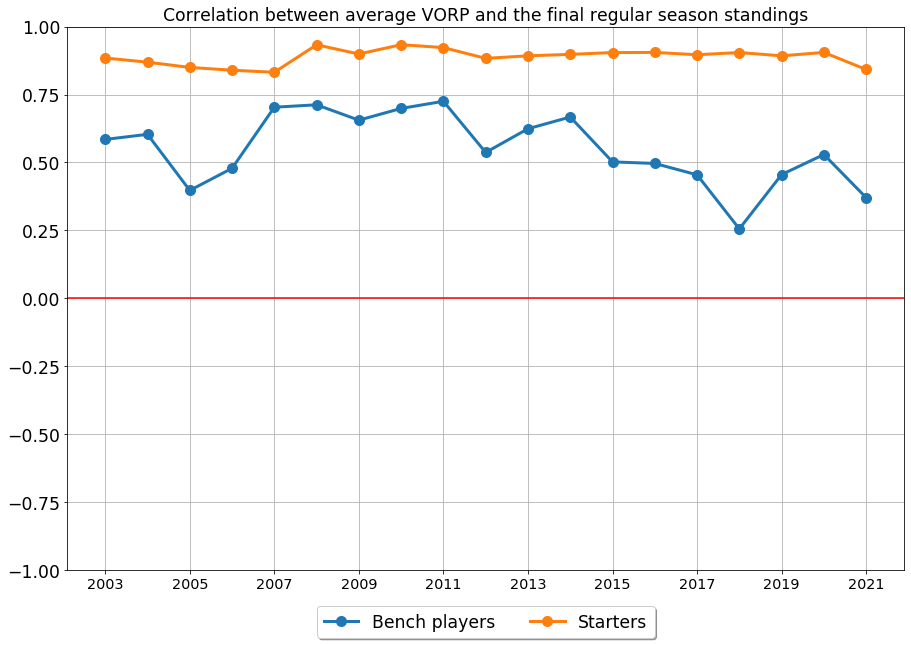

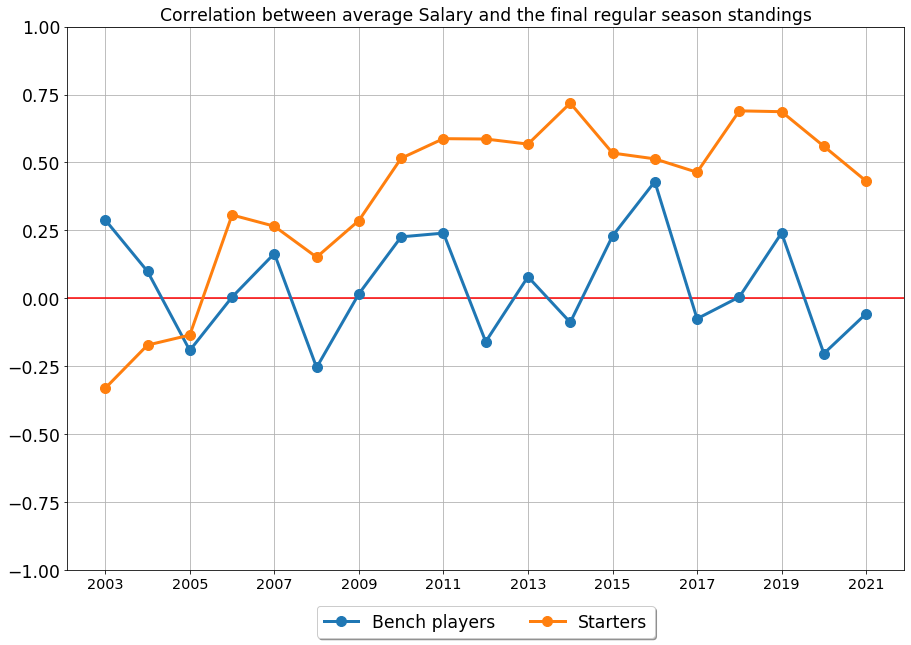

In [13]:
for stat in starters_corr.index:
    plt.figure(figsize=(15,10))
    plt.axhline(y=0.0, color='r', linestyle='-')
    plt.plot(SEASONS[3:-1], bench_corr.loc[stat], lw=3, marker='o', ms=10, label="Bench players")
    plt.plot(SEASONS[3:-1], starters_corr.loc[stat], lw=3, marker='o', ms=10, label="Starters")
    plt.grid()
    plt.xticks(SEASONS[3:-1:2])
    plt.yticks(np.arange(-1.0, 1.1, 0.25))
    plt.title(f"Correlation between average {stat} and the final regular season standings")
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=2)
    plt.show()
    

# Starter Analysys

In [14]:
starters_per_season = []

for i in range(len(SEASONS)):    
    df = player_dfs[i].sort_values(by=['Tm', 'GS'], ascending=[True, False])
    cols = df.columns    
    starters_df = pd.DataFrame(columns = cols)
    for team in CURRENT_TEAMS:
        starters = pd.DataFrame(df[df["Tm"] == team][:5])
        starters = starters.mean()
        starters_df.loc[team] = starters

    starters_df.drop(["Player", "Pos", "Tm"], axis=1, inplace=True)
    starters_df.index.names = ["Team"]
    starters_per_season.append(starters_df)

In [15]:
starter_avg_per_season = {}

for stat in PLAYER_STATS:
    starter_avg_per_season[stat] = []
    for df in starters_per_season:
        starter_avg_per_season[stat].append(df[stat].mean())

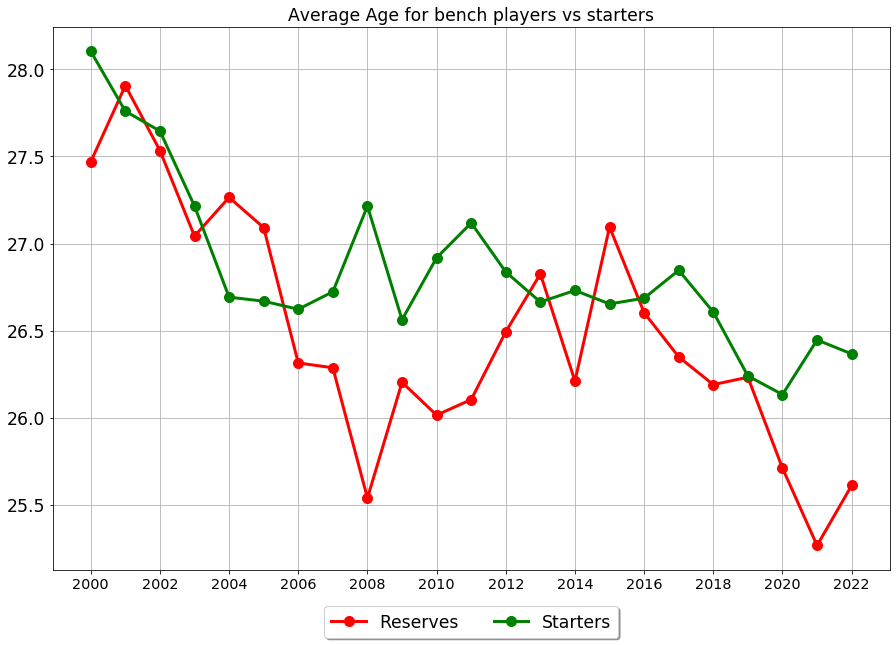

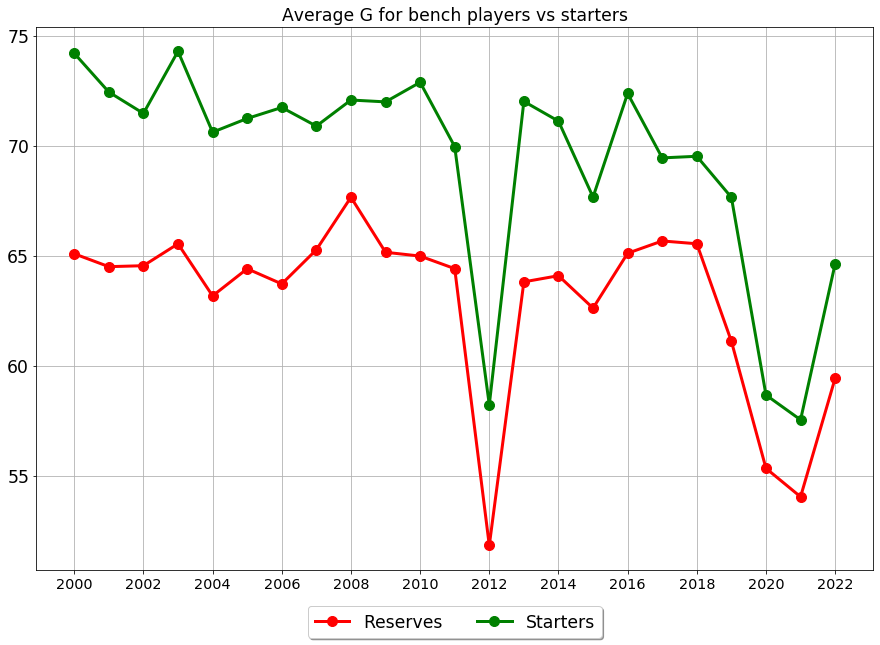

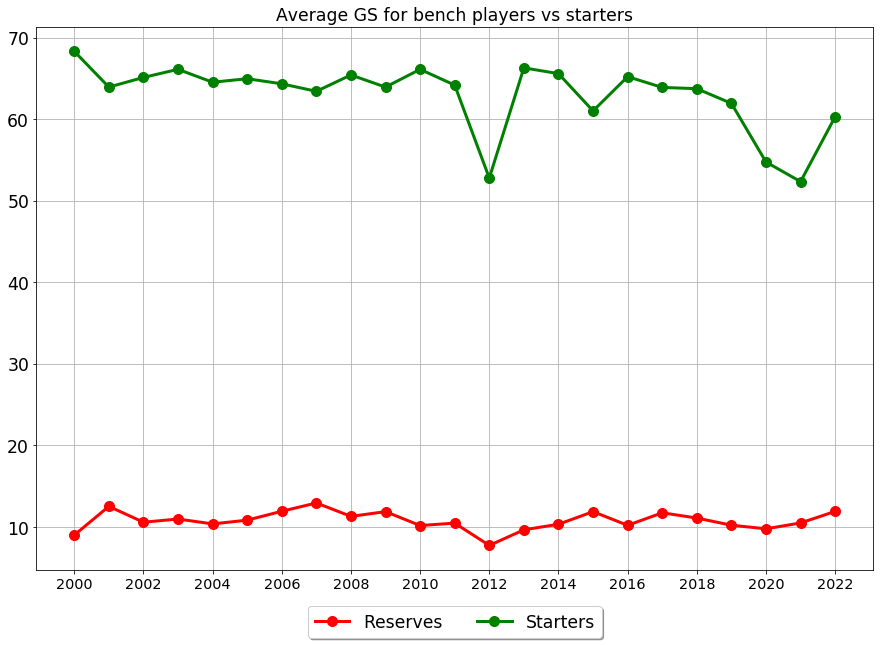

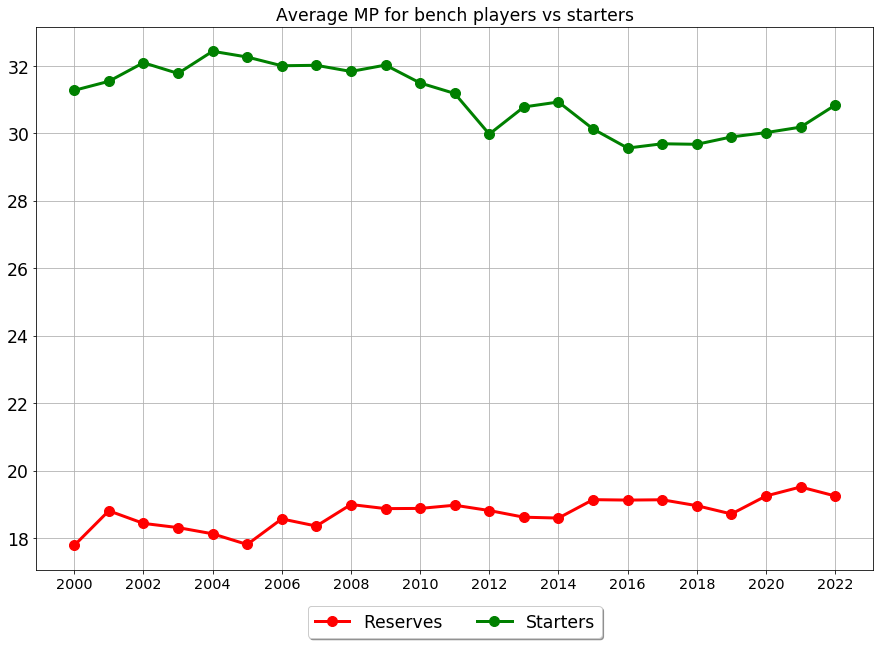

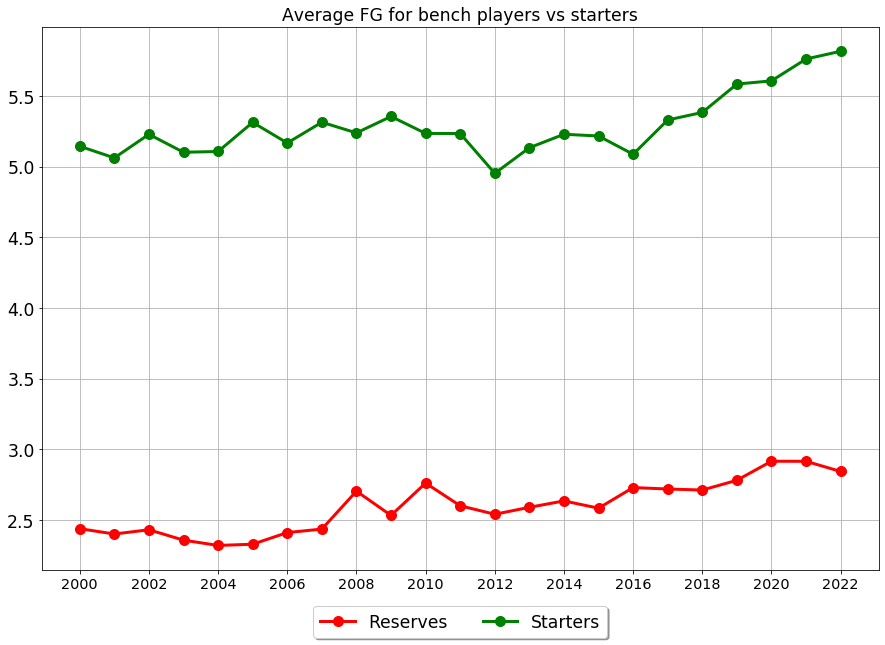

...

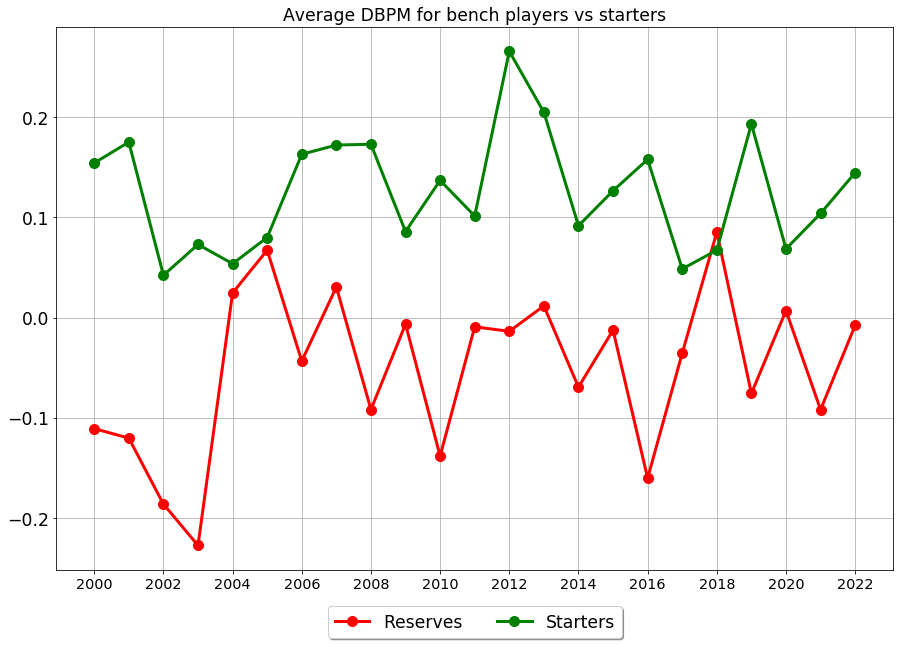

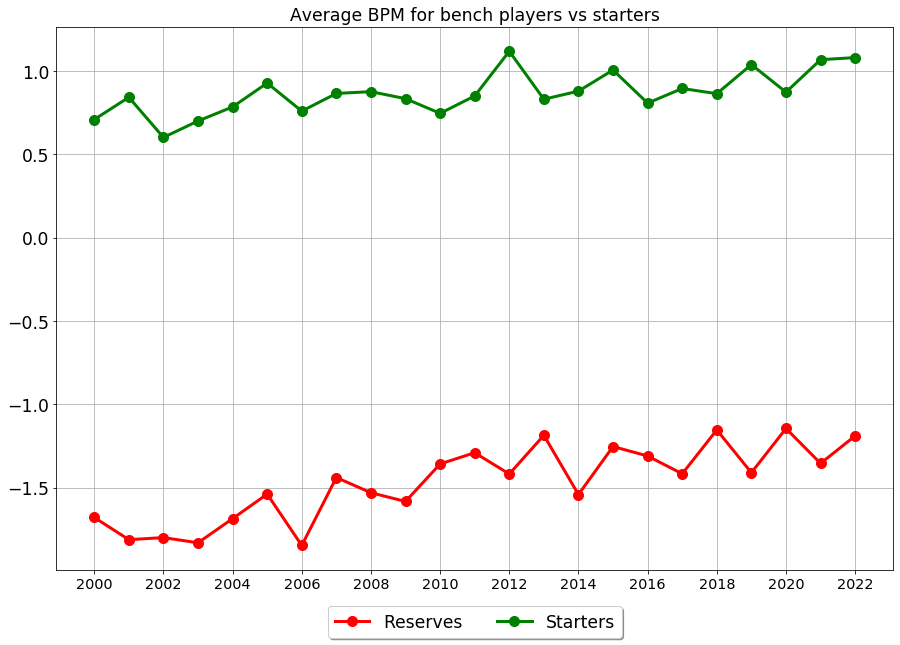

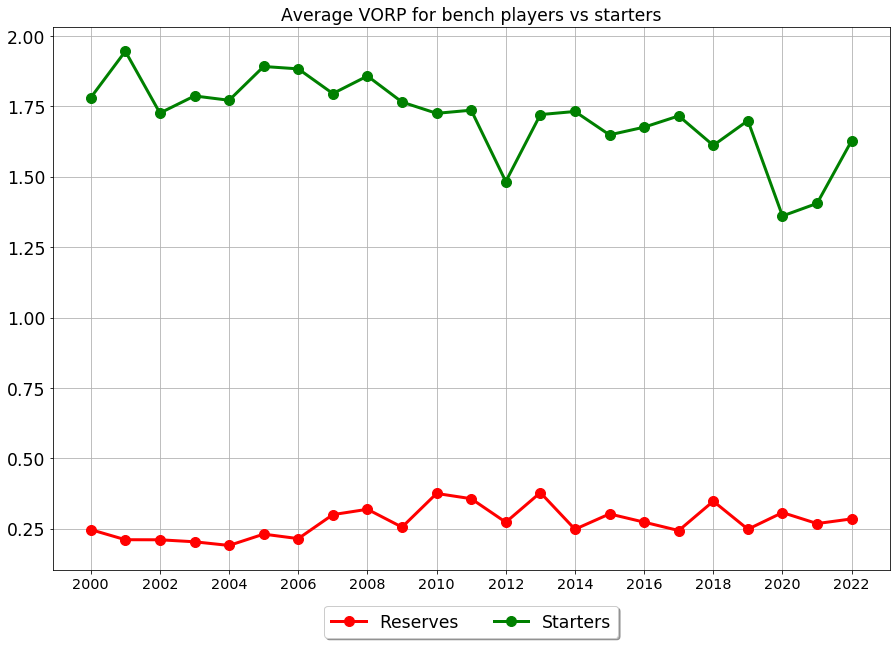

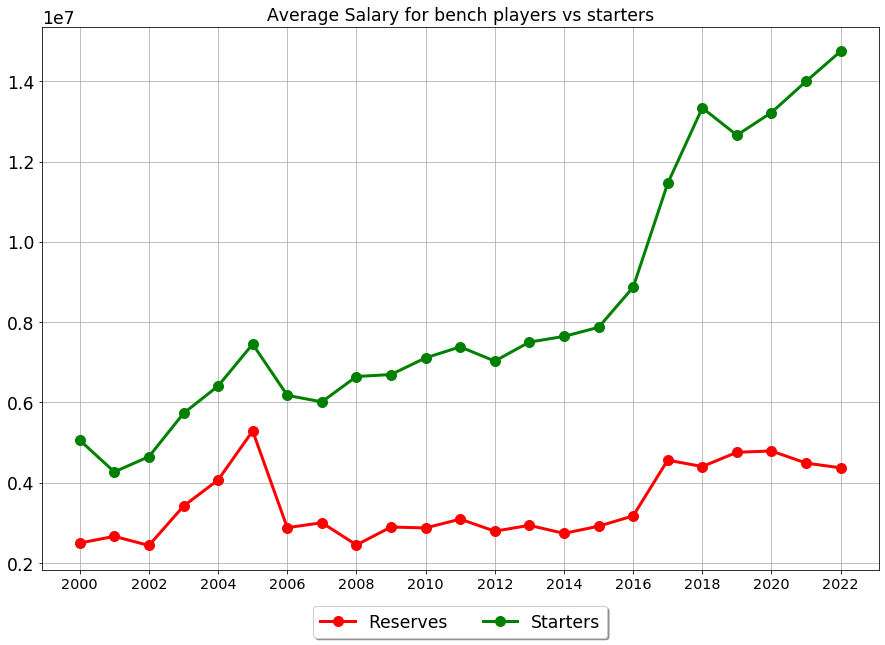

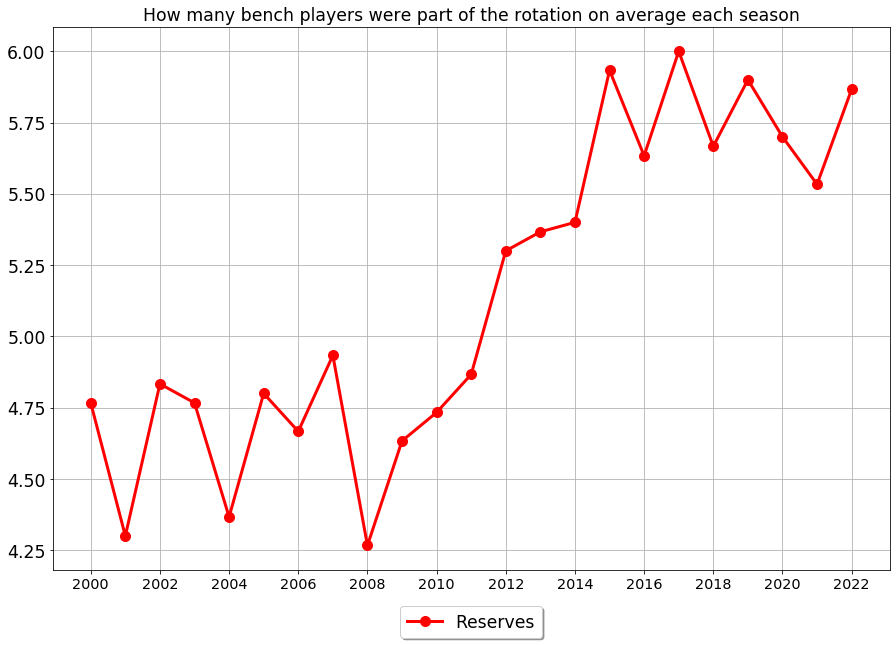

In [23]:
for stat in bench_avg_per_season:
    plt.figure(figsize=(15,10))
    plt.grid()
    plt.plot(SEASONS, bench_avg_per_season[stat], label="Reserves", lw=3, marker='o', ms=10, c='r')
    plt.title(f"How many bench players were part of the rotation on average each season")

    if stat != "Count":
        plt.plot(SEASONS, starter_avg_per_season[stat], label="Starters", lw=3, marker='o', ms=10, c='g')
        plt.title(f"Average {stat} for bench players vs starters")
        
    plt.xticks(SEASONS[::2])
        
    if '/' in stat:
        stat = stat.replace('/', '_')
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=2)
    if stat == 'Count':
        plt.savefig(f"Results/DepthEvolution/{stat}_starters_and_reserves_each_season")
    plt.show()

# From now on, the analysys will focus on playoff stats

In [17]:
playoff_player_dfs = []

for season in SEASONS:
    playoff_player_df = get_playoff_csvs_by_season(season)
    playoff_player_dfs.append(playoff_player_df)
#     playoff_standings_dfs.append(playoff_standings_df)
    

In [18]:
bench_per_playoff = []

for i in range(len(SEASONS)):    
    df = playoff_player_dfs[i].sort_values(by=['Tm', 'GS'], ascending=[True, False])
    df.insert(len(df.columns), "Count", 0)
    cols = df.columns    
    bench = pd.DataFrame(columns = cols)
    for team in CURRENT_TEAMS:
        bench_players = pd.DataFrame(df[df["Tm"] == team][5:])
        bench_players = bench_players[bench_players["G"] >= 2]
        number_of_qualifying_reserves = bench_players.shape[0]
        bench_players = bench_players.mean()
        if number_of_qualifying_reserves > 0:
            bench_players["Count"] = number_of_qualifying_reserves
        bench.loc[team] = bench_players

    bench.drop(["Player", "Pos", "Tm"], axis=1, inplace=True)
    bench.dropna(how='all', inplace=True)
    bench.index.names = ["Team"]
    bench_per_playoff.append(bench)

In [19]:
bench_avg_per_playoff = {}

for stat in BENCH_STATS:
    if stat != 'Salary':
        bench_avg_per_playoff[stat] = []
        for df in bench_per_playoff:
            bench_avg_per_playoff[stat].append(df[stat].mean())

In [20]:
starters_per_playoff = []

for i in range(len(SEASONS)):    
    df = playoff_player_dfs[i].sort_values(by=['Tm', 'GS'], ascending=[True, False])
    cols = df.columns    
    starters_df = pd.DataFrame(columns = cols)
    for team in CURRENT_TEAMS:
        starters = pd.DataFrame(df[df["Tm"] == team][:5])
        starters = starters.mean()
        starters_df.loc[team] = starters

    starters_df.drop(["Player", "Pos", "Tm"], axis=1, inplace=True)
    starters_df.dropna(how='all', inplace=True)
    starters_df.index.names = ["Team"]
    starters_per_playoff.append(starters_df)

In [26]:
starter_avg_per_playoff = {}


for stat in PLAYER_STATS:
    if stat != 'Salary':
        starter_avg_per_playoff[stat] = []
        for df in starters_per_playoff:
            starter_avg_per_playoff[stat].append(df[stat].mean())

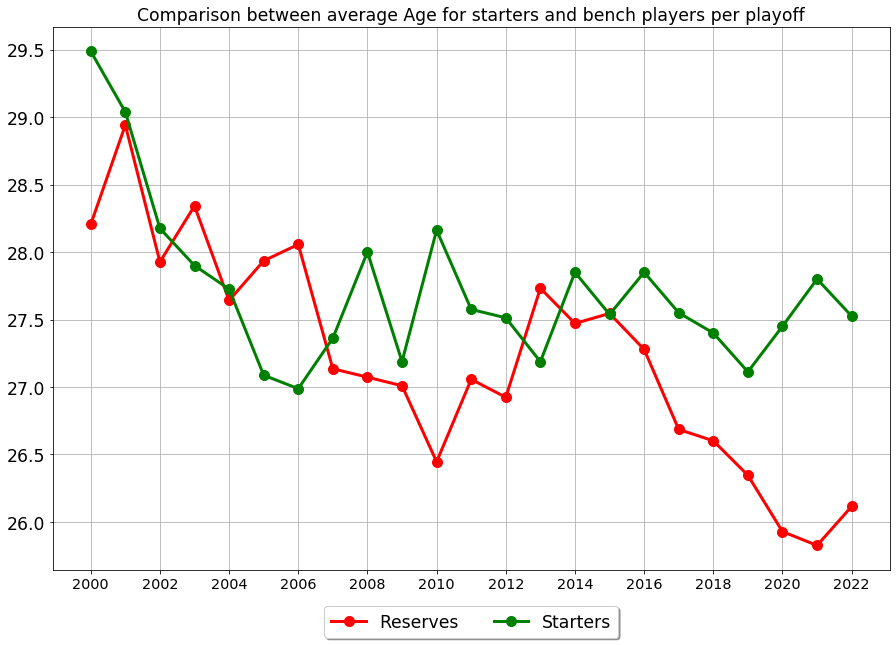

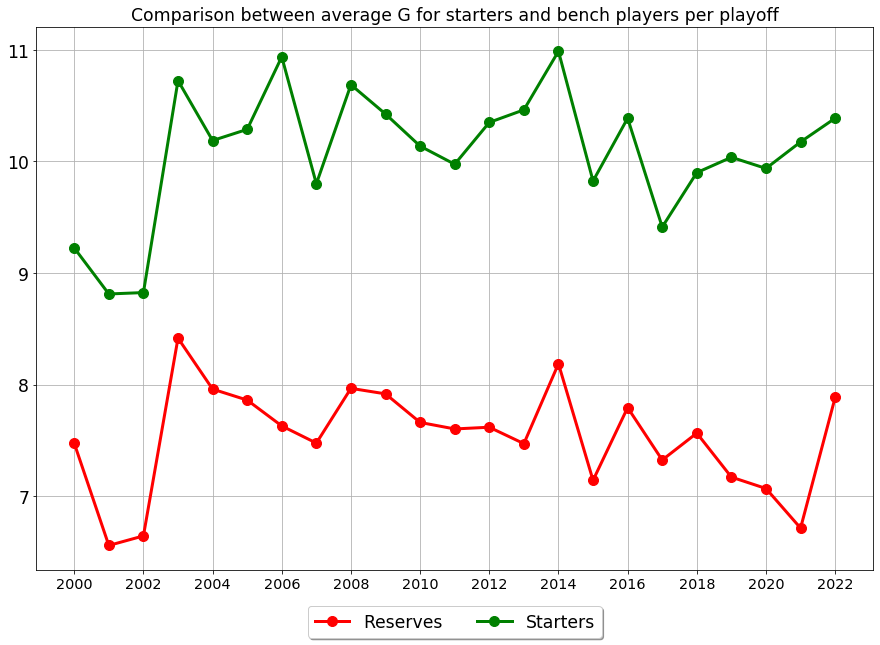

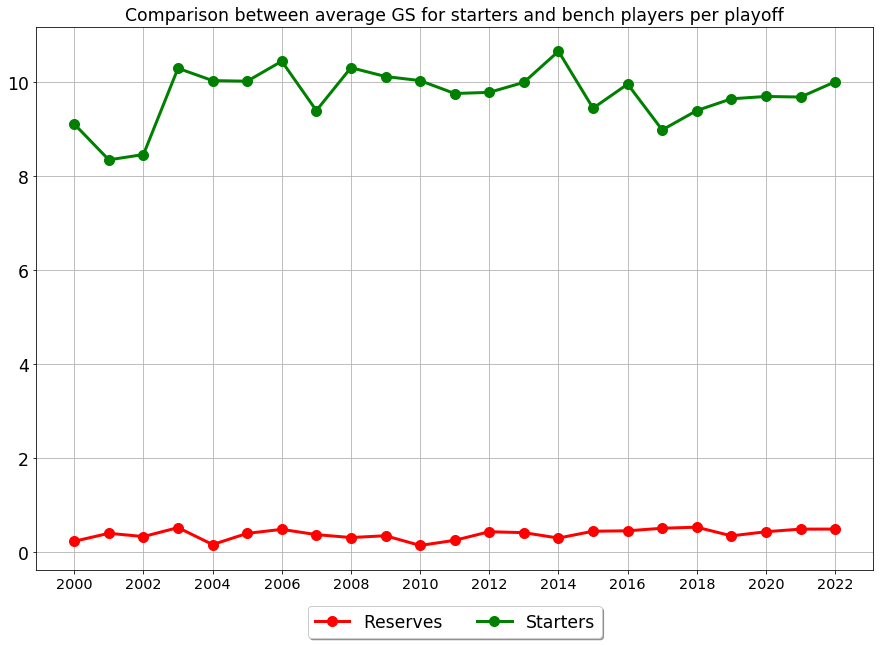

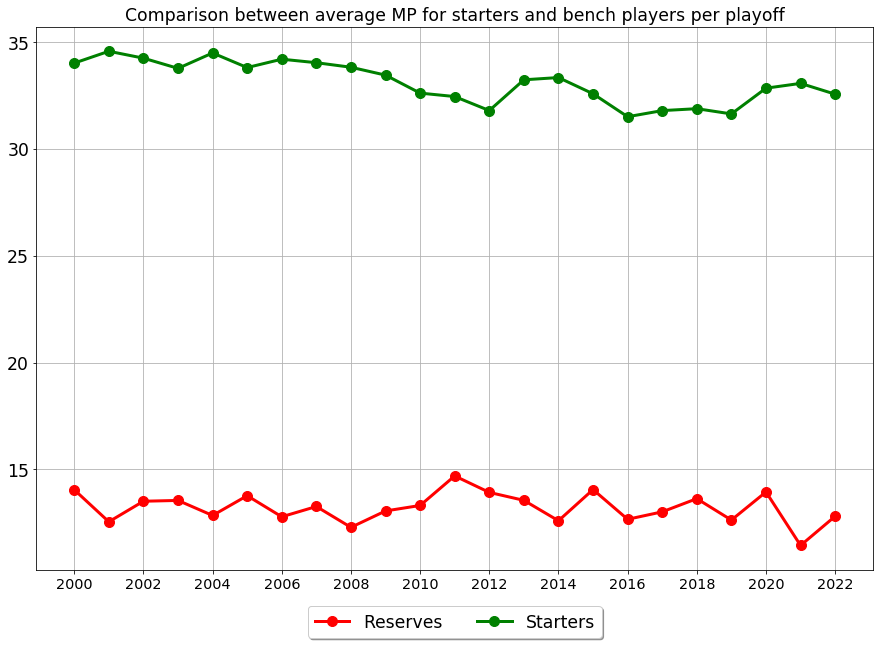

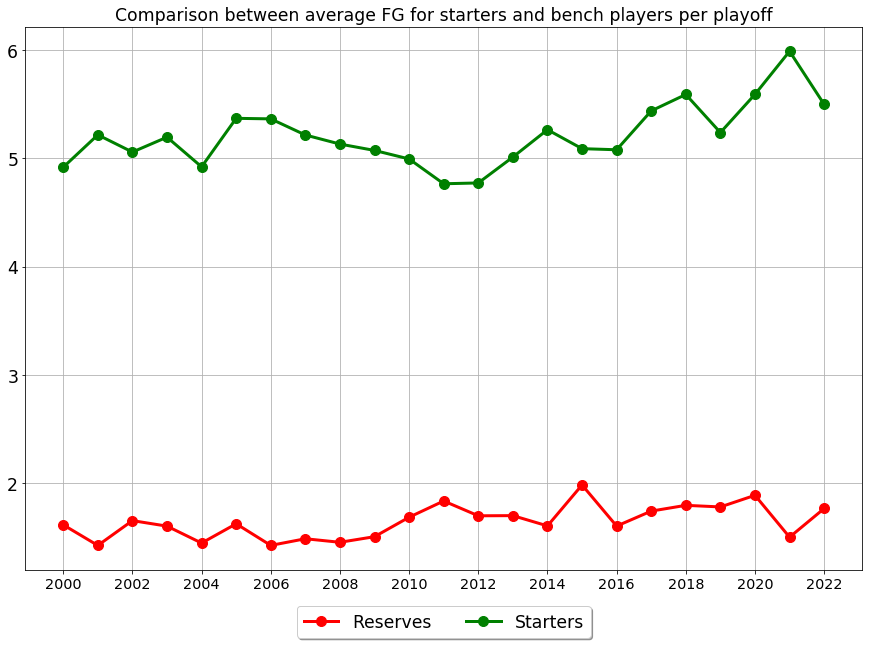

...

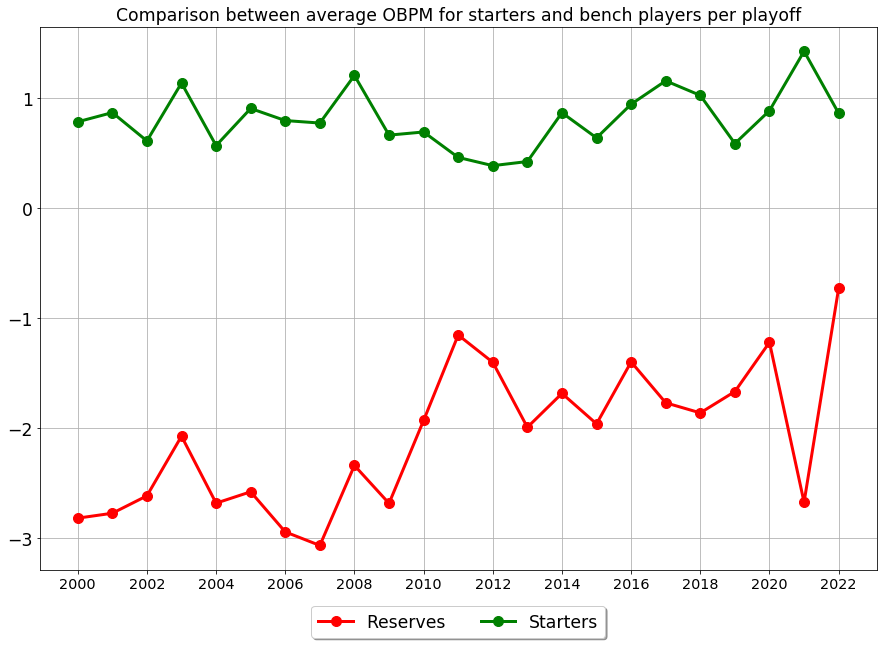

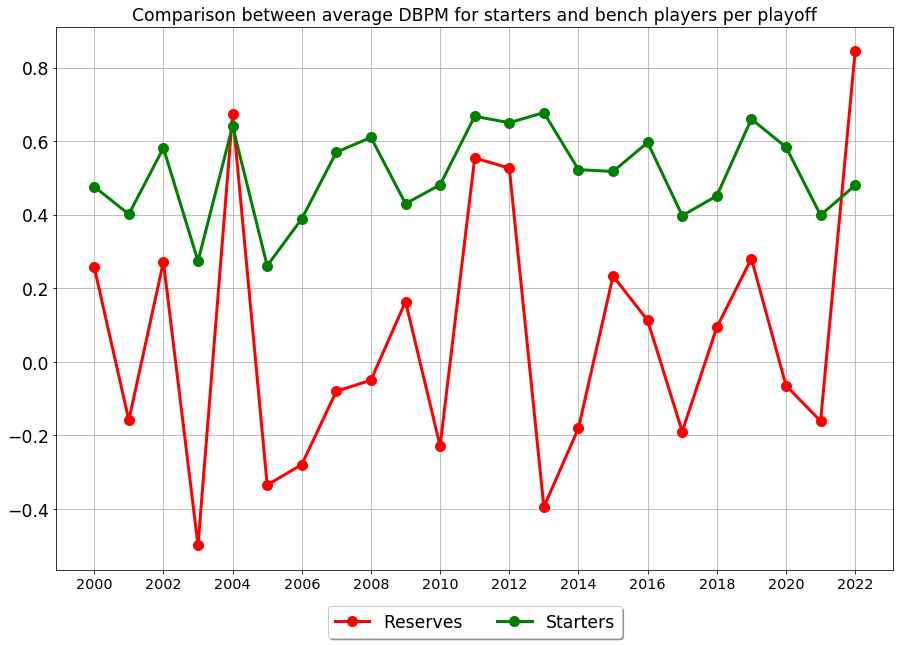

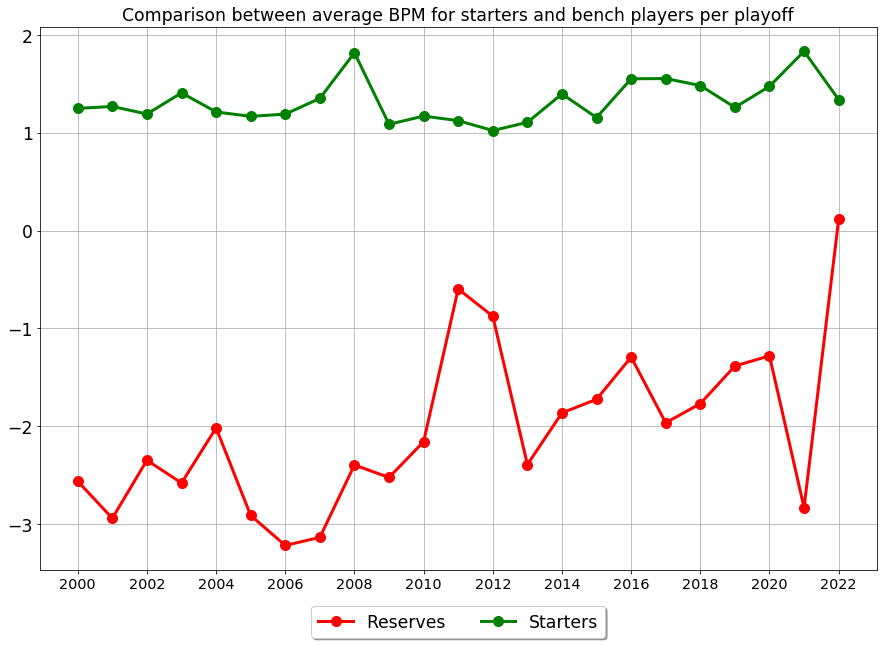

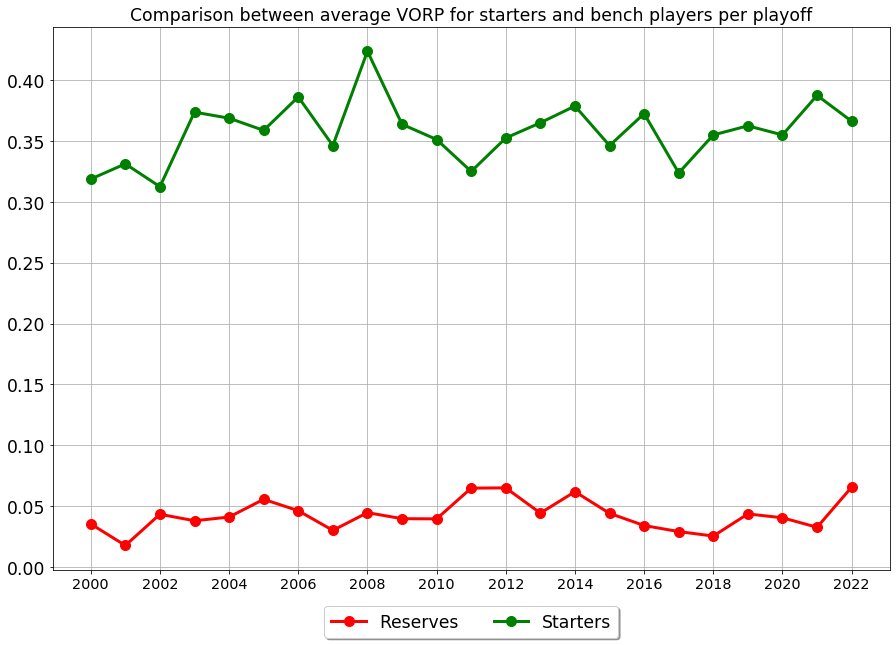

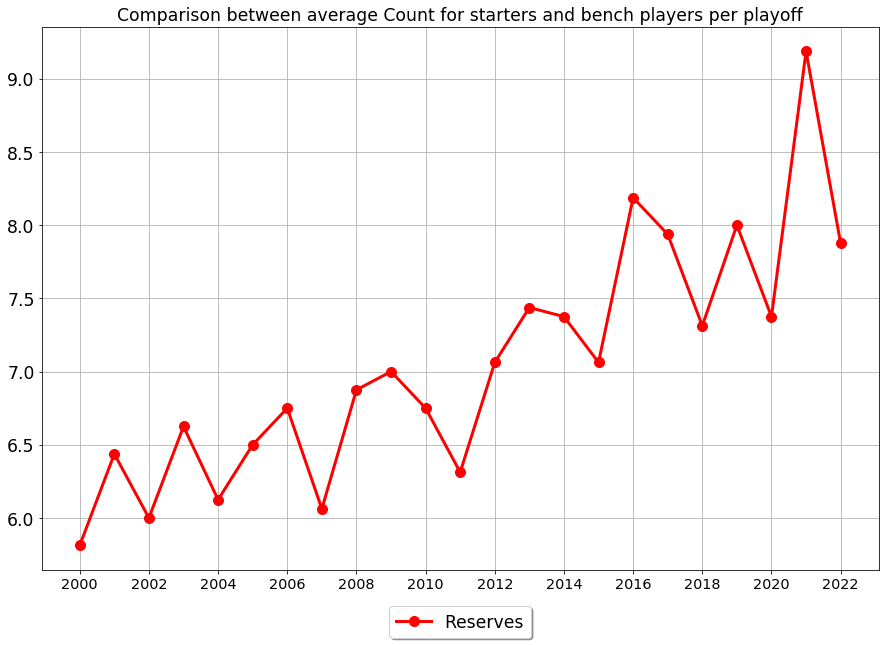

In [29]:
for stat in bench_avg_per_playoff:
    plt.figure(figsize=(15,10))
    plt.grid()
    plt.plot(SEASONS, bench_avg_per_playoff[stat], label="Reserves", lw=3, marker='o', ms=10, c='r')
    if stat != "Count":
        plt.plot(SEASONS, starter_avg_per_playoff[stat], label="Starters", lw=3, marker='o', ms=10, c='g')
    plt.xticks(SEASONS[::2])

    if '/' in stat:
        stat = stat.replace('/', '_')
    plt.title(f"Comparison between average {stat} for starters and bench players per playoff")
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=2)
    plt.savefig(f"Results/DepthEvolution_Playoffs/{stat}_starters_and_reserves_each_playoff")
    plt.show()